# Time series analysis

In [1]:
using Plots
using DataFrames: DataFrame, nrow
using StatsBase: mean, std
using Random: MersenneTwister

include("../src/Simulation.jl")
using Main.Simulation:
    Param, Model, C, D, WEAK_THRESHOLD, MEDIUM_THRESHOLD, STRONG_THRESHOLD, 
    POPULATION, PAYOFF, STRATEGY_MUTATION, RELATIONSHIP_MUTATION,
    get_death_birth_N_vec, make_output_df, interaction!, death!, birth!, log!
include("../src/Network.jl")
using Main.Network: nv, degree, neighbors, normalize_degree!, normalize_weight!, convert_2nd_order

In [2]:
function environmental_variability1(timesteps::Int, μ::Float64, a::Float64)::Vector{Float64}
    return [mod(t, 400) <= 200 ? sin(t / 12) * a / 2 + μ : sin(t / 4) * a * 8 + μ for t in 1:timesteps]
end

function environmental_variability2(timesteps::Int, wavelength::Int, amplitude::Float64)::Vector{Float64}
    return [
        [1.0 for t in 1:round(Int, timesteps / 7 * 1)]...,
        [1.0 + amplitude * (mod(t, wavelength) ≤ wavelength / 2 ? 1.0 : -1.0) for t in round(Int, timesteps / 7 * 1 + 1):round(Int, timesteps / 7 * 2)]...,
        [1.0 for t in round(Int, timesteps / 7 * 2 + 1):round(Int, timesteps / 7 * 3)]...,
        [1.0 + amplitude * (mod(t, wavelength) ≤ wavelength / 2 ? 1.0 : -1.0) for t in round(Int, timesteps / 7 * 3 + 1):round(Int, timesteps / 7 * 4)]...,
        [1.0 for t in round(Int, timesteps / 7 * 4 + 1):round(Int, timesteps / 7 * 5)]...,
        [1.0 + amplitude * (mod(t, wavelength) ≤ wavelength / 2 ? 1.0 : -1.0) for t in round(Int, timesteps / 7 * 5 + 1):round(Int, timesteps / 7 * 6)]...,
        [1.0 for t in round(Int, timesteps / 7 * 6 + 1):timesteps]...,
    ]
end

function run(model::Model; log_level::Int = 0, log_skip::Int = 1)::Tuple{DataFrame, Vector{Any}, Vector{Any}}
    log_generations = filter(x -> x % log_skip == 0, 1:(model.param.generations))
    log_row_n = 1

    output_df = make_output_df(model.param, log_level, length(log_generations))
    strategy_vec_vec = []
    weights_vec = []

    for generation = 1:(model.param.generations)
        model.generation = generation
        model.payoff_vec .= 0.0

        interaction!(model)
        death!(model, model.param.rng)
        birth!(model, model.param.rng)
        normalize_degree!(model.weights, model.param.initial_k)
        normalize_weight!(model.weights, Float64(model.param.initial_w) * model.param.initial_k * model.param.initial_N)

        if generation ∈ log_generations
            log!(output_df, model, log_level, log_row_n)
            push!(strategy_vec_vec, copy(model.strategy_vec))
            push!(weights_vec, copy(model.weights))
            log_row_n += 1
        end
    end

    return output_df, strategy_vec_vec, weights_vec
end;

In [15]:
trial = 3
timesteps = 6000

# Common parameters
common_params = Dict{Any, Any}(
    :initial_N => 1000,
    :initial_k => 100,
    :initial_T => 1.5,
    :S => -0.5,
    :initial_w => 0.5,
    :Δw => 0.05,
    :interaction_freqency => 1.0,
    :reproduction_rate => 0.05,
    :δ => 1.0,
    :initial_μ_s => 0.01,
    :initial_μ_r => 0.01,
    :generations => timesteps,
)

# Stable parameters
stable_params = copy(common_params)
stable_params[:β] = 0.0
stable_params[:sigma] = 0.0

# POPULATION variable parameters
population_params = copy(common_params)
population_params[:variability_mode] = POPULATION
population_params[:β] = 0.8
population_params[:sigma] = 180.0

# Paramベクトルの生成
param_dic_vec = [population_params]
param_vec_vec = [[Param(; param..., rng = MersenneTwister(seed)) for seed in 1:trial] for param in param_dic_vec]

# Modelベクトルの生成
model_vec_vec = [[Model(param) for param in param_vec] for param_vec in param_vec_vec];

In [16]:
@time result_vec_vec = fetch.(Threads.@spawn [run(model) for model in model_vec] for model_vec in model_vec_vec);

133.148060 seconds (529.26 M allocations: 273.841 GiB, 18.13% gc time, 0.03% compilation time)


DataFrameRow
 Row │ β        sigma    variability_mode 
     │ Float64  Float64  String           
─────┼────────────────────────────────────
   1 │     0.8    180.0  POPULATION


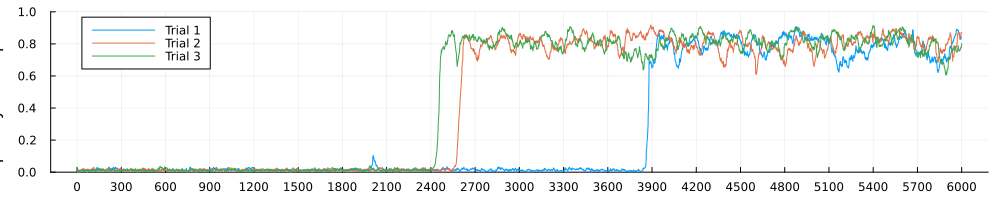

In [17]:
for result_vec in result_vec_vec
    p = plot(ylim = (0, 1), xl = "Time step", yl = "Frequency of Cooperator", size = (1000, 200))
    println(result_vec[1][1][1, [:β, :sigma, :variability_mode]])

    for (trial, (output_df, strategy_vec_vec, weights_vec)) in enumerate(result_vec)
        plot!(output_df.generation, output_df.cooperation_rate, label = "Trial $(trial)", ylim = (0, 1), xticks = 0:(timesteps / 20):timesteps)
    end

    display(p)
end

In [34]:
population_result_vec = result_vec_vec[1]
output_df, strategy_vec_vec, weights_vec = population_result_vec[1];

第3857世代
協力率: 0.03508771929824561
弱い繋がりグループ: 1 個 570
中程度の繋がりグループ: 1個 570
強い繋がりグループ: 1個 570
弱い繋がりグループ: 9 個 562
中程度の繋がりグループ: 19個 552
強い繋がりグループ: 30個 541


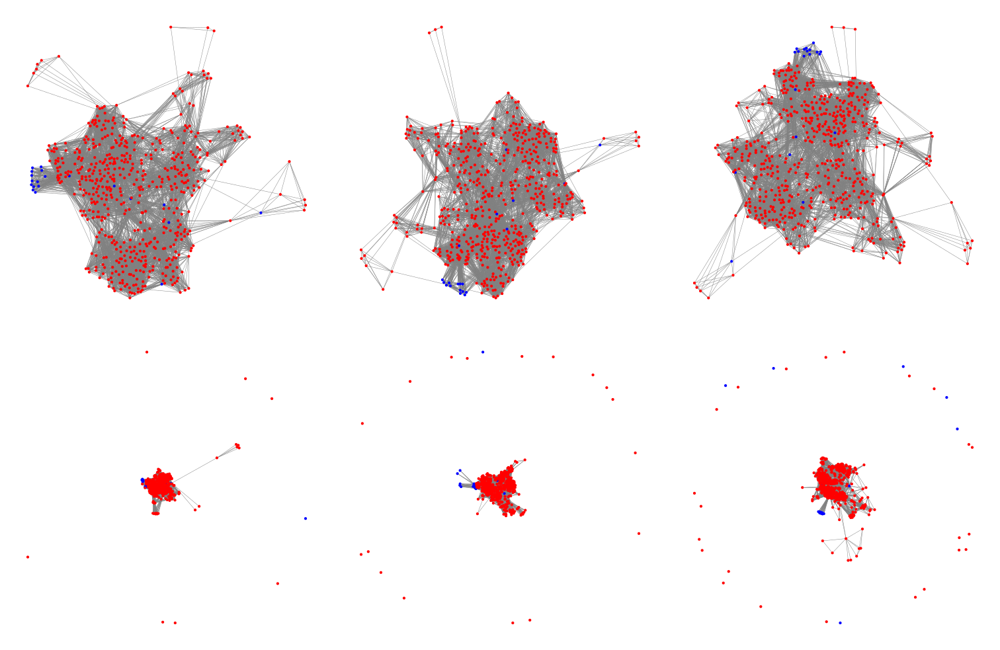

第3875世代
協力率: 0.3851851851851852
弱い繋がりグループ: 10 個 522
中程度の繋がりグループ: 16個 512
強い繋がりグループ: 35個 490
弱い繋がりグループ: 171 個 365
中程度の繋がりグループ: 228個 309
強い繋がりグループ: 246個 294


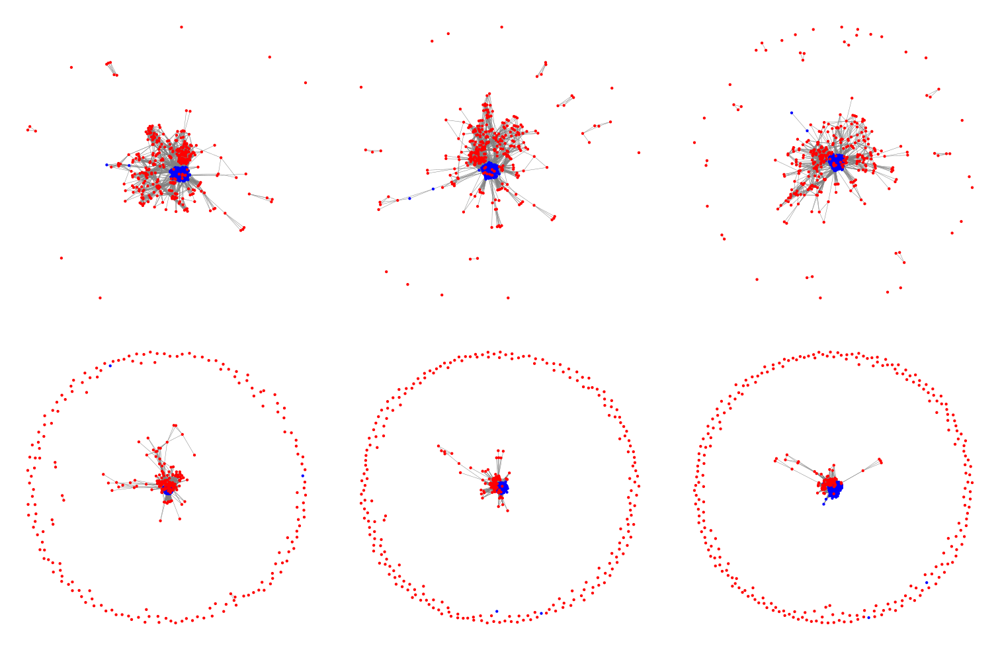

false

In [38]:
using Cairo
using Compose
using Graphs: SimpleGraph, connected_components
using GraphPlot: gplot, spring_layout

function recognize_components(weights::Matrix{Float16})::Tuple{SimpleGraph, SimpleGraph, SimpleGraph}
    g25 = SimpleGraph(weights .>= WEAK_THRESHOLD)
    g50 = SimpleGraph(weights .>= MEDIUM_THRESHOLD)
    g75 = SimpleGraph(weights .>= STRONG_THRESHOLD)

    g25_components = [length(c) for c in connected_components(g25)]
    g50_components = [length(c) for c in connected_components(g50)]
    g75_components = [length(c) for c in connected_components(g75)]

    println("弱い繋がりグループ: $(length(g25_components)) 個 $(sort(g25_components, rev=true)[1])")
    println("中程度の繋がりグループ: $(length(g50_components))個 $(sort(g50_components, rev=true)[1])")
    println("強い繋がりグループ: $(length(g75_components))個 $(sort(g75_components, rev=true)[1])")

    return g25, g50, g75
end

function network_diagram(g25::SimpleGraph, g50::SimpleGraph, g75::SimpleGraph, color_val_vec::Vector)::Context
    return hstack(
        gplot(g25, nodefillc=color_val_vec, edgestrokec = colorant"gray", spring_layout(g25, C = 4.0)...),
        gplot(g50, nodefillc=color_val_vec, edgestrokec = colorant"gray", spring_layout(g50, C = 4.0)...),
        gplot(g75, nodefillc=color_val_vec, edgestrokec = colorant"gray", spring_layout(g75, C = 4.0)...)
    )
end

i = 3857

println("第$(i)世代")
println("協力率: $(mean(strategy_vec_vec[i] .== C))")

color_val_vec = [s == C ? colorant"blue" : colorant"red" for s in strategy_vec_vec[i]]

g25, g50, g75 = recognize_components(weights_vec[i])
p1 = network_diagram(g25, g50, g75, color_val_vec)

weights2 = convert_2nd_order(weights_vec[i])
g25, g50, g75 = recognize_components(weights2)
p2 = network_diagram(g25, g50, g75, color_val_vec)

set_default_graphic_size(24cm, 8cm)
draw(PNG(400, 260), vstack(p1, p2))

i = 3875

println("第$(i)世代")
println("協力率: $(mean(strategy_vec_vec[i] .== C))")

color_val_vec = [s == C ? colorant"blue" : colorant"red" for s in strategy_vec_vec[i]]

g25, g50, g75 = recognize_components(weights_vec[i])
p1 = network_diagram(g25, g50, g75, color_val_vec)

weights2 = convert_2nd_order(weights_vec[i])
g25, g50, g75 = recognize_components(weights2)
p2 = network_diagram(g25, g50, g75, color_val_vec)

set_default_graphic_size(24cm, 8cm)
draw(PNG(400, 260), vstack(p1, p2))

In [39]:
function get_color(cooperation_rate::Float64)::RGB
    if cooperation_rate < 0.1
        return RGB(0xB3/255, 0x20/255, 0x34/255) #B32034
    elseif cooperation_rate < 0.2
        return RGB(0xBF/255, 0x49/255, 0x59/255) #BF4959
    elseif cooperation_rate < 0.3
        return RGB(0xC5/255, 0x60/255, 0x6D/255) #C5606D
    elseif cooperation_rate < 0.4
        return RGB(0xD1/255, 0x91/255, 0x9A/255) #D1919A
    elseif cooperation_rate < 0.5
        return RGB(0xDD/255, 0xC6/255, 0xC9/255) #DDC6C9
    elseif cooperation_rate < 0.6
        return RGB(0x2D/255, 0x57/255, 0x9A/255) #2D579A
    elseif cooperation_rate < 0.7
        return RGB(0x50/255, 0x74/255, 0xAC/255) #5074AC
    elseif cooperation_rate < 0.8
        return RGB(0x65/255, 0x84/255, 0xB5/255) #6584B5
    elseif cooperation_rate < 0.9
        return RGB(0x92/255, 0xA7/255, 0xC8/255) #92A7C8
    else
        return RGB(0xC6/255, 0xCF/255, 0xDA/255) #C6CFDA
    end
end;

timestep: 3830
Cooperation rate: 0.01


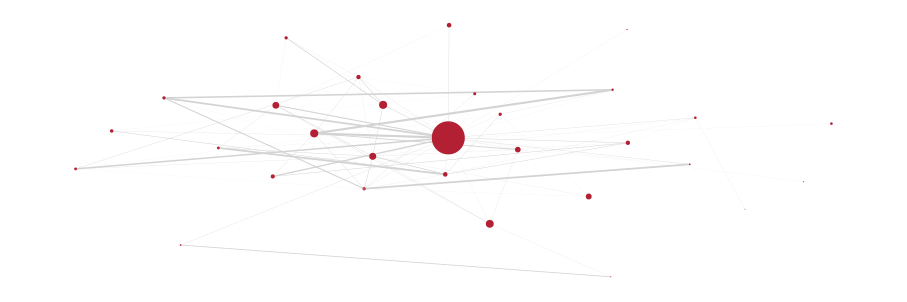

timestep: 3833
Cooperation rate: 0.01


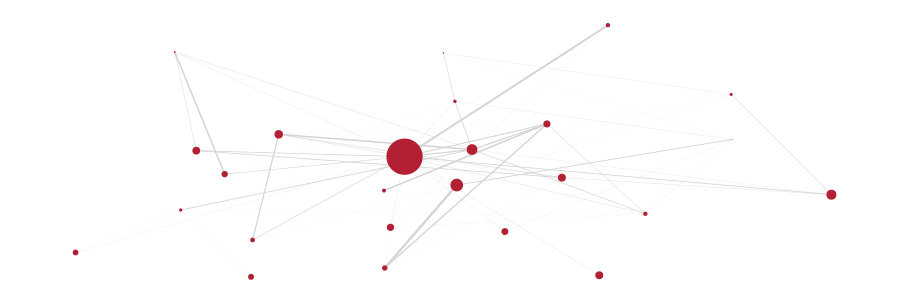

timestep: 3836
Cooperation rate: 0.01


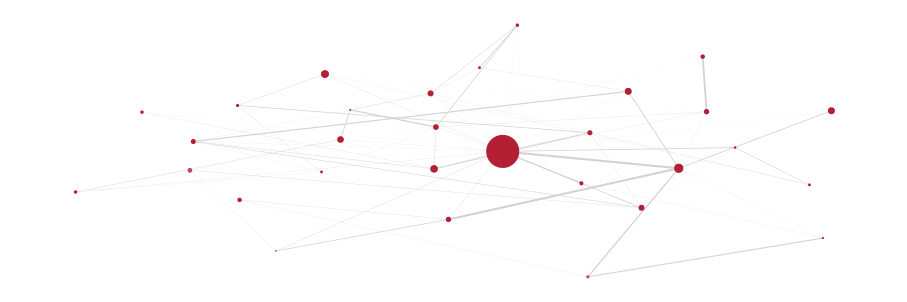

timestep: 3839
Cooperation rate: 0.02


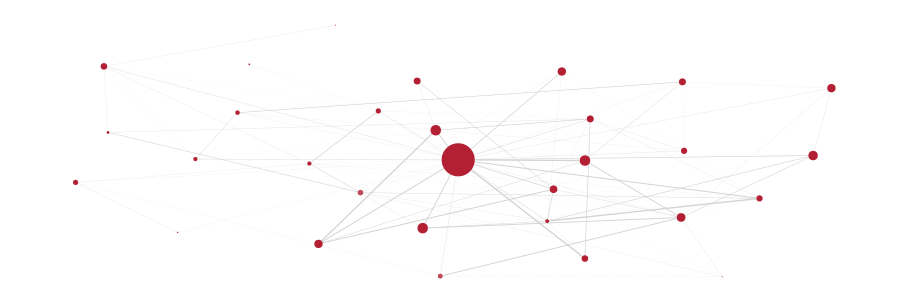

timestep: 3842
Cooperation rate: 0.02


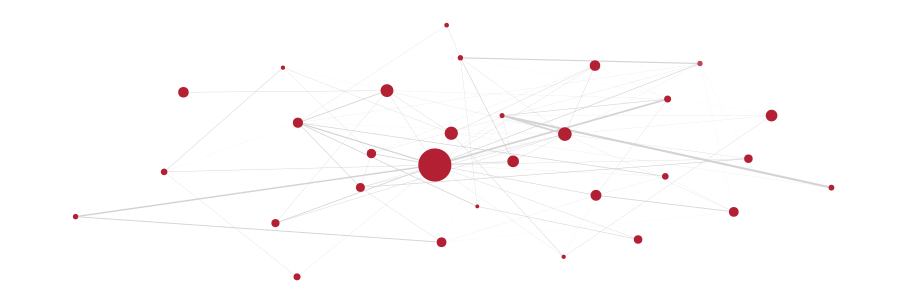

timestep: 3845
Cooperation rate: 0.03


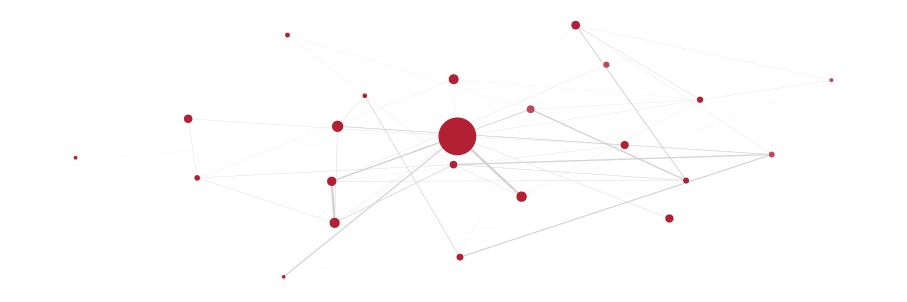

timestep: 3848
Cooperation rate: 0.03


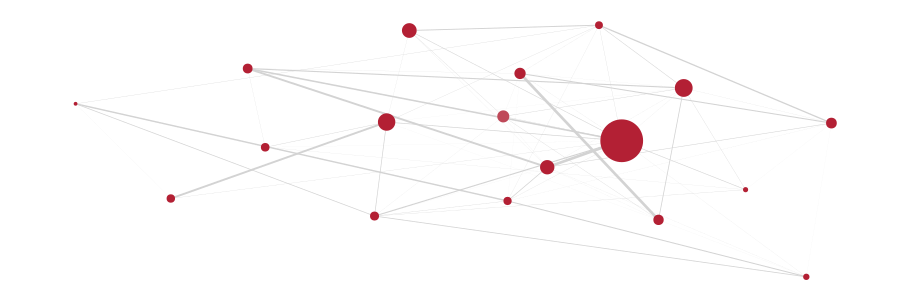

timestep: 3851
Cooperation rate: 0.03


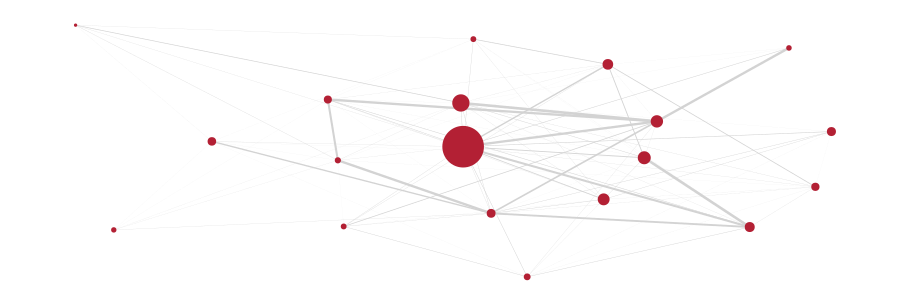

timestep: 3854
Cooperation rate: 0.03


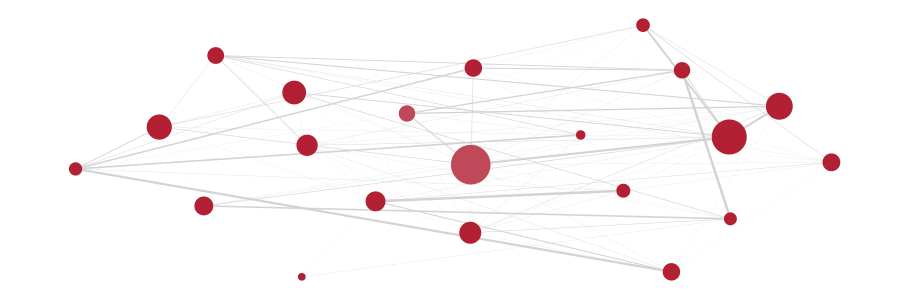

timestep: 3857
Cooperation rate: 0.04


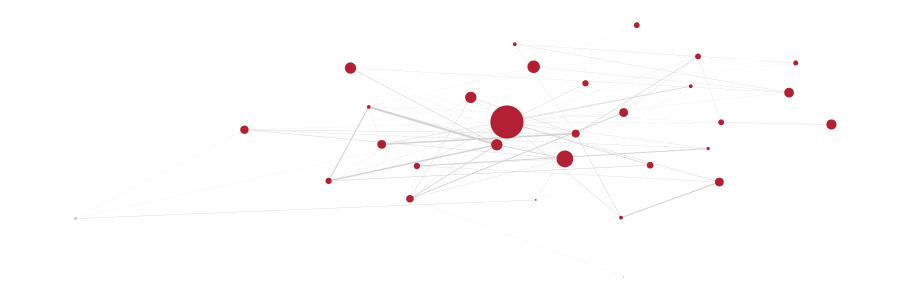

timestep: 3860
Cooperation rate: 0.08


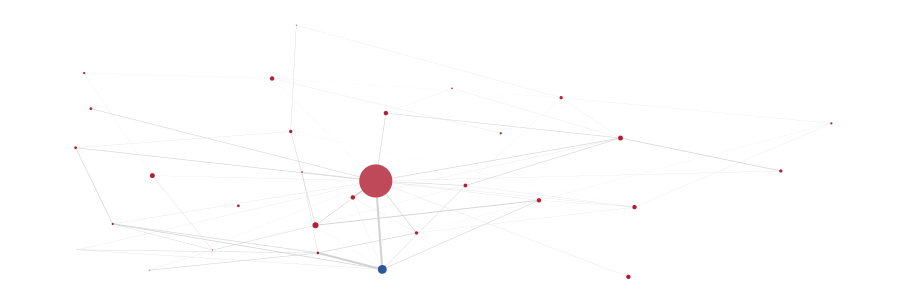

timestep: 3863
Cooperation rate: 0.14


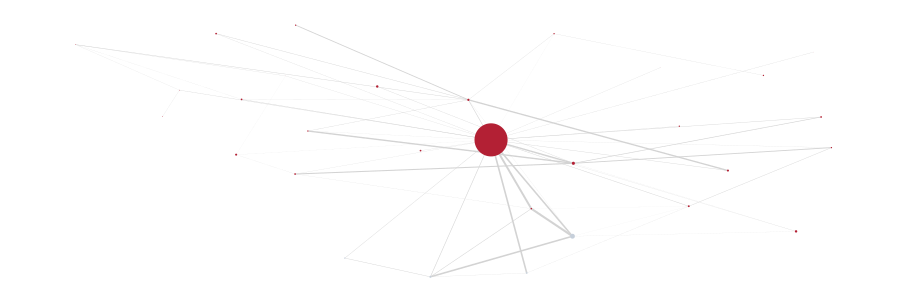

timestep: 3866
Cooperation rate: 0.19


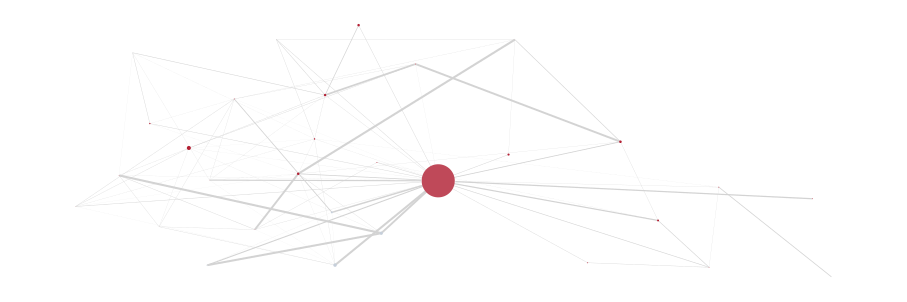

timestep: 3869
Cooperation rate: 0.22


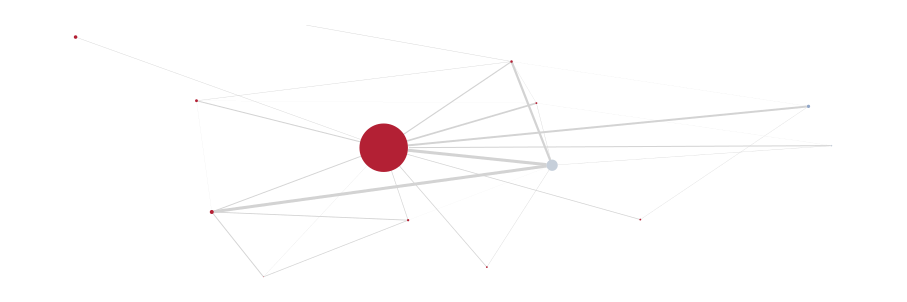

timestep: 3872
Cooperation rate: 0.28


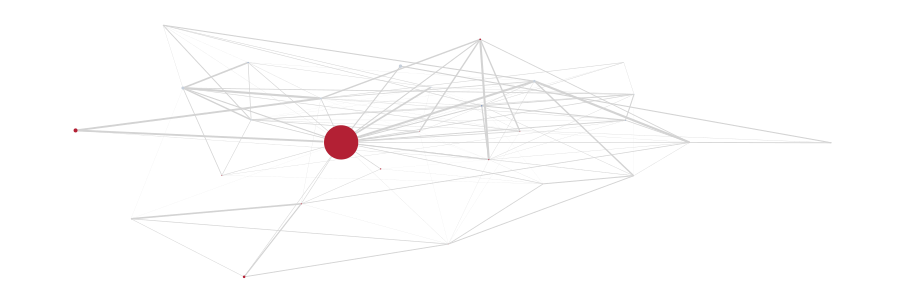

timestep: 3875
Cooperation rate: 0.39


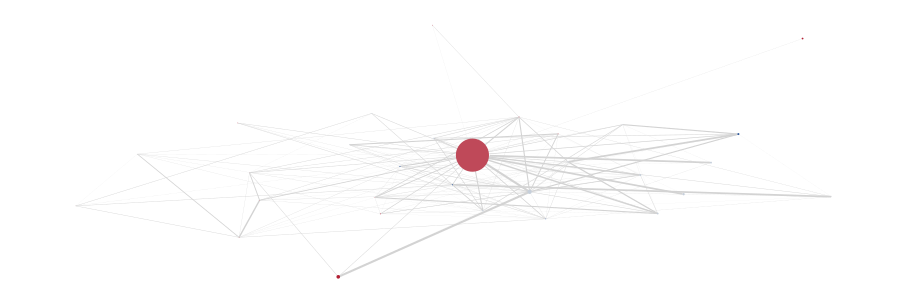

timestep: 3878
Cooperation rate: 0.53


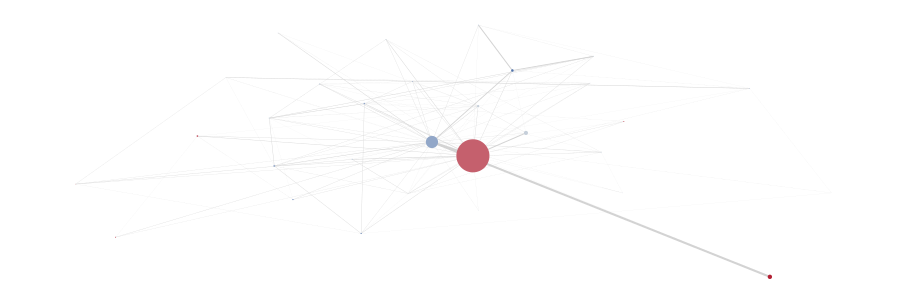

In [40]:
using SimpleWeightedGraphs
using CommunityDetection

for timestep in 3830:3:3880
    N = nv(weights_vec[timestep])
    g = SimpleWeightedGraph(weights_vec[timestep])
    strategy_vec = strategy_vec_vec[timestep]

    # コミュニティ検出 (Spectral Clustering: Bethe Hessian matrix)
    communities = community_detection_bethe(g, kmax = 30)

    # コミュニティ毎にノードを分類
    community_count = maximum(communities)
    community_vec = [[] for _ in 1:community_count]
    for (i, community) in enumerate(communities)
        push!(community_vec[community], i)
    end
    community_vec = sort(community_vec, by = x -> length(x), rev = true)

    cooperation_rate_vec = [mean(strategy_vec[community] .== C) for community in community_vec]

    if maximum(cooperation_rate_vec) > 0.01
        println("timestep: $(timestep)")
        println("Cooperation rate: $(round(mean(strategy_vec .== C), digits = 2))")
        # グラフのノードのサイズと色を設定
        node_sizes = [length(community) * 10 for community in community_vec]  # コミュニティのサイズに応じて調整
        node_colors = [get_color(cooperation_rate) for cooperation_rate in cooperation_rate_vec]  # 協力者の比率に応じて色を設定

        # コミュニティ間の重みを計算する
        adj_mat = fill(0.0, (community_count, community_count))
        for x in 1:community_count, y in 1:community_count
            if x > y
                for node_x in community_vec[x], node_y in community_vec[y]
                    adj_mat[x, y] += weights_vec[timestep][node_x, node_y]
                    adj_mat[y, x] += weights_vec[timestep][node_x, node_y]
                end
            end
        end
        adj_mat ./= maximum(adj_mat)
        adj_mat = round.(adj_mat, digits = 2)
        edge_widths = [adj_mat[i, j] for i in 1:community_count, j in 1:community_count if i != j]

        # コミュニティグラフの生成
        community_graph = SimpleGraph(adj_mat)

        # ネットワークをプロット
        display(gplot(community_graph, nodesize=node_sizes, nodefillc=node_colors, edgelinewidth=edge_widths))
    end
end

In [41]:
function weighted_clustering_coefficient(g::SimpleWeightedGraph, i::Int)::Float64
    # N = nv(g)
    N = size(g.weights, 1)

    max_w = maximum(g.weights)
    max_w > 0 || return 0.0

    numerator = 0.0
    denominator = 0.0

    for j in 1:N, h in 1:N
        (j == i || h == i || j >= h) && continue

        w_ij = g.weights[i, j]
        w_ih = g.weights[i, h]
        w_jh = g.weights[j, h]

        if w_ij > 0 && w_ih > 0
            harmonic_mean = (1 / w_ij + 1 / w_ih) / 2
            denominator += 2 / (harmonic_mean + 1 / max_w)
            if w_jh > 0
                numerator += 2 / (harmonic_mean + 1 / w_jh)
            end
        end
    end

    return denominator != 0 ? numerator / denominator : 0.0
end;

In [42]:
using SimpleWeightedGraphs: rem_vertex!

function analysis(timestep::Int)::Nothing
    g = SimpleWeightedGraph(weights_vec[timestep])
    strategy_vec = strategy_vec_vec[timestep]

    N = size(g.weights, 1)
    n_C = sum(strategy_vec .== C)
    # mean_C_C = round(mean([weighted_clustering_coefficient(g, i) for i in 1:N if strategy_vec[i] == C]), digits = 3)
    # mean_C_D = round(mean([weighted_clustering_coefficient(g, i) for i in 1:N if strategy_vec[i] == D]), digits = 3)

    for (i, strategy) in enumerate(strategy_vec)
        if strategy == D
            g.weights[i, :] .= 0.0
        end
    end

    mean_C_CG = round(mean([weighted_clustering_coefficient(g, i) for i in 1:size(g.weights, 1)]), digits = 3)
    
    println("timestep: $(timestep), N: $(N), n_C: $(n_C), C_rate: $(round(n_C / N, digits = 3)),\tmean_C_CG: $(mean_C_CG)")
end;

In [46]:
for i in 3800:3900
    analysis(i)
end

timestep: 3800, N: 1353, n_C: 12, C_rate: 0.009,	mean_C_CG: 0.0


LoadError: InterruptException:

In [44]:
timestep = 3840

g = SimpleWeightedGraph(weights_vec[timestep])
strategy_vec = strategy_vec_vec[timestep]

N = size(g.weights, 1)
n_C = sum(strategy_vec .== C)
# mean_C_C = round(mean([weighted_clustering_coefficient(g, i) for i in 1:N if strategy_vec[i] == C]), digits = 3)
# mean_C_D = round(mean([weighted_clustering_coefficient(g, i) for i in 1:N if strategy_vec[i] == D]), digits = 3)

for (i, strategy) in enumerate(strategy_vec)
    if strategy == D
        g.weights[i, :] .= 0.0
    end
end

mean_C_CG = round(mean([weighted_clustering_coefficient(g, i) for i in 1:size(g.weights, 1)]), digits = 3)


0.001

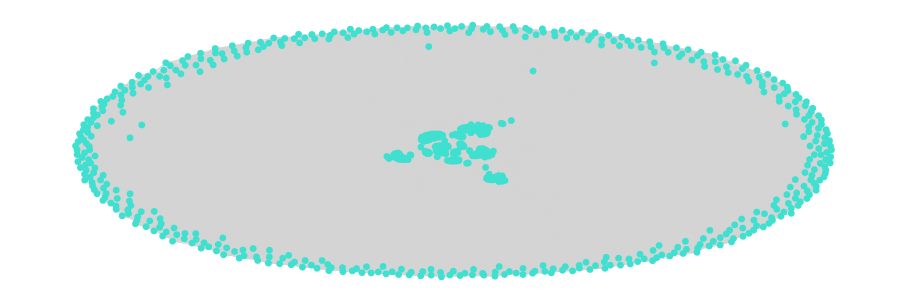

In [45]:
gplot(g)